In [194]:
import os
import glob
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
from torchvision.ops import FeaturePyramidNetwork
from torchvision.ops.feature_pyramid_network import LastLevelMaxPool
from collections import OrderedDict
from tqdm import tqdm

from torch.utils.data import Subset, DataLoader
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

In [ ]:
class CatDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = []
        self.annotation_files = []

        for i in range(7):
            folder = os.path.join(root_dir, f"CAT_0{i}")
            image_files = glob.glob(os.path.join(folder, "*.jpg"))
            self.image_files.extend(image_files)
            self.annotation_files.extend([f + ".cat" for f in image_files])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        annotation_path = self.annotation_files[idx]

        image = Image.open(img_path).convert("RGB")
        
        if self.transform:
            transformed_image = self.transform(image)
            width, height = image.size

            # Read and scale points based on the resized image dimensions
            with open(annotation_path, 'r') as file:
                points = np.array([float(coord) for coord in file.read().split()[1:]]).reshape(-1)
                
                # Scale x coordinates
                points[::2] *= (224 / width)
                # Scale y coordinates
                points[1::2] *= (224 / height)

            
            points_tensor = torch.tensor(points, dtype=torch.float)

        return {'image': transformed_image, 'points': points_tensor}

TypeError: conv2d() received an invalid combination of arguments - got (str, Parameter, NoneType, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!str!, !Parameter!, !NoneType!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!str!, !Parameter!, !NoneType!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)


In [179]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [180]:
# Create dataset and dataloader
dataset = CatDataset(root_dir='/kaggle/input/cat-dataset', transform=transform)

In [181]:
# Split indices into training and evaluation sets
train_indices, eval_indices = train_test_split(list(range(len(dataset))), test_size=0.2, random_state=24)

In [182]:
# Subset datasets
train_dataset = Subset(dataset, train_indices)
eval_dataset = Subset(dataset, eval_indices)

In [183]:
# Create DataLoader instances
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
eval_dataloader = DataLoader(eval_dataset, batch_size=32, shuffle=False, num_workers=4)

In [184]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [185]:
class ResFPN_Classifier(nn.Module):
    def __init__(self, num_points=9, architecture='resnet50', pretrained=True):
        super(ResFPN_Classifier, self).__init__()
        
        if architecture == 'resnet50':
            self.backbone = models.resnet50(pretrained=pretrained)
        elif architecture == 'resnet101':
            self.backbone = models.resnet101(pretrained=pretrained)
        else:
            raise ValueError("Architecture must be 'resnet50' or 'resnet101'")
        
        
        # Freeze the parameters of the backbone
        for param in self.backbone.parameters():
            param.requires_grad = False
            
            
        # Feature Pyramid Network (FPN)
        self.fpn = FeaturePyramidNetwork(
            in_channels_list=[512, 1024, 2048],  # Only c2, c3, c4
            out_channels=256,
            extra_blocks=LastLevelMaxPool()
        )
        
        # Head for ResNet features
        self.resnet_head = nn.Linear(2048, 512)  
        self.dropout = nn.Dropout(0.5)
        self.relu = nn.ReLU()
        self.final_head = nn.Linear(512, num_points * 2) 

        # Head for FPN features
        self.fpn_head = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(256, num_points * 2)
        )

    def forward(self, x):
        c1 = self.backbone.layer1(self.backbone.relu(self.backbone.bn1(self.backbone.conv1(x))))
        c2 = self.backbone.layer2(c1)
        c3 = self.backbone.layer3(c2)
        c4 = self.backbone.layer4(c3)
        c5 = F.adaptive_avg_pool2d(c4, (1, 1)).view(c4.size(0), -1)
        
        # ResNet head
        x_resnet = self.resnet_head(c5)
        x_resnet = self.relu(x_resnet)
        x_resnet = self.dropout(x_resnet)
        x_resnet = self.final_head(x_resnet)

        # FPN head
        fpn_features = OrderedDict([('c2', c2), ('c3', c3), ('c4', c4)])
        fpn_features = self.fpn(fpn_features)
        logits_fpn = []
        for feature in fpn_features.values():
            logits_fpn.append(self.fpn_head(feature))

        logits_fpn = torch.stack(logits_fpn, dim=0).mean(dim=0)
        
        return x_resnet + logits_fpn

In [186]:
model = ResFPN_Classifier(num_points=9, architecture='resnet50', pretrained=True)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [187]:
if torch.cuda.is_available():
    model.to(device)

In [188]:
num_epochs = 50

for epoch in range(num_epochs):
    # Training loop
    model.train()
    running_loss = 0.0
    
    with tqdm(enumerate(train_dataloader), total=len(train_dataloader), desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, sample in pbar:
            images = sample['image'].to(device)
            points = sample['points'].to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, points.view(points.size(0), -1))
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            # Update the progress bar with current loss value
            pbar.set_postfix({'loss': running_loss / (i + 1)})
    
    # Validation loop (evaluate after each epoch)
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for i, sample in enumerate(eval_dataloader):
            images = sample['image'].to(device)
            points = sample['points'].to(device)

            outputs = model(images)
            loss = criterion(outputs, points.view(points.size(0), -1))

            val_loss += loss.item()
    
    val_loss /= len(eval_dataloader)
    print(f'Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss:.4f}')

print('Finished Training')


Epoch 1/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=1.2e+3] 


Epoch 1/50, Validation Loss: 929.7022


Epoch 2/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=877]  


Epoch 2/50, Validation Loss: 753.0981


Epoch 3/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=494]


Epoch 3/50, Validation Loss: 410.5453


Epoch 4/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=335]


Epoch 4/50, Validation Loss: 329.9537


Epoch 5/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=305]


Epoch 5/50, Validation Loss: 308.6191


Epoch 6/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=262]


Epoch 6/50, Validation Loss: 275.2746


Epoch 7/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=241]


Epoch 7/50, Validation Loss: 278.7449


Epoch 8/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=225]


Epoch 8/50, Validation Loss: 250.1452


Epoch 9/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=207]


Epoch 9/50, Validation Loss: 229.7247


Epoch 10/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=193]


Epoch 10/50, Validation Loss: 228.2417


Epoch 11/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=182]


Epoch 11/50, Validation Loss: 211.8482


Epoch 12/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=171]


Epoch 12/50, Validation Loss: 220.4367


Epoch 13/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=161]


Epoch 13/50, Validation Loss: 213.0135


Epoch 14/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=160]


Epoch 14/50, Validation Loss: 225.9153


Epoch 15/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=146]


Epoch 15/50, Validation Loss: 237.1052


Epoch 16/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=141]


Epoch 16/50, Validation Loss: 183.5183


Epoch 17/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=129]


Epoch 17/50, Validation Loss: 196.9322


Epoch 18/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=125]


Epoch 18/50, Validation Loss: 180.4095


Epoch 19/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=119]


Epoch 19/50, Validation Loss: 201.7623


Epoch 20/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=113]


Epoch 20/50, Validation Loss: 181.9990


Epoch 21/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=106] 


Epoch 21/50, Validation Loss: 184.5730


Epoch 22/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=101] 


Epoch 22/50, Validation Loss: 197.9647


Epoch 23/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=97]  


Epoch 23/50, Validation Loss: 173.9293


Epoch 24/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=89.6]


Epoch 24/50, Validation Loss: 177.2829


Epoch 25/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=87.3]


Epoch 25/50, Validation Loss: 183.9464


Epoch 26/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=83.3]


Epoch 26/50, Validation Loss: 174.8681


Epoch 27/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=76.6]


Epoch 27/50, Validation Loss: 167.9962


Epoch 28/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=78.4]


Epoch 28/50, Validation Loss: 170.5917


Epoch 29/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=70.4]


Epoch 29/50, Validation Loss: 164.3379


Epoch 30/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=69.2]


Epoch 30/50, Validation Loss: 163.7405


Epoch 31/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=67.9]


Epoch 31/50, Validation Loss: 159.3663


Epoch 32/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=65.1]


Epoch 32/50, Validation Loss: 157.4548


Epoch 33/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=62]  


Epoch 33/50, Validation Loss: 169.3830


Epoch 34/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=63.5]


Epoch 34/50, Validation Loss: 164.8102


Epoch 35/50: 100%|██████████| 250/250 [01:05<00:00,  3.85it/s, loss=59.8]


Epoch 35/50, Validation Loss: 165.0596


Epoch 36/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=55.9]


Epoch 36/50, Validation Loss: 167.0552


Epoch 37/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=55]  


Epoch 37/50, Validation Loss: 158.7350


Epoch 38/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=53.8]


Epoch 38/50, Validation Loss: 154.6162


Epoch 39/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=53.5]


Epoch 39/50, Validation Loss: 158.0421


Epoch 40/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=53.1]


Epoch 40/50, Validation Loss: 157.8930


Epoch 41/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=50.5]


Epoch 41/50, Validation Loss: 151.2666


Epoch 42/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=48.6]


Epoch 42/50, Validation Loss: 151.5343


Epoch 43/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=48.2]


Epoch 43/50, Validation Loss: 153.5274


Epoch 44/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=47.5]


Epoch 44/50, Validation Loss: 150.4727


Epoch 45/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=43.9]


Epoch 45/50, Validation Loss: 163.1144


Epoch 46/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=41]  


Epoch 46/50, Validation Loss: 154.0734


Epoch 47/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=45.3]


Epoch 47/50, Validation Loss: 149.9264


Epoch 48/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=44.6]


Epoch 48/50, Validation Loss: 152.6111


Epoch 49/50: 100%|██████████| 250/250 [01:04<00:00,  3.85it/s, loss=41.7]


Epoch 49/50, Validation Loss: 149.8686


Epoch 50/50: 100%|██████████| 250/250 [01:04<00:00,  3.86it/s, loss=41]  


Epoch 50/50, Validation Loss: 147.4592
Finished Training


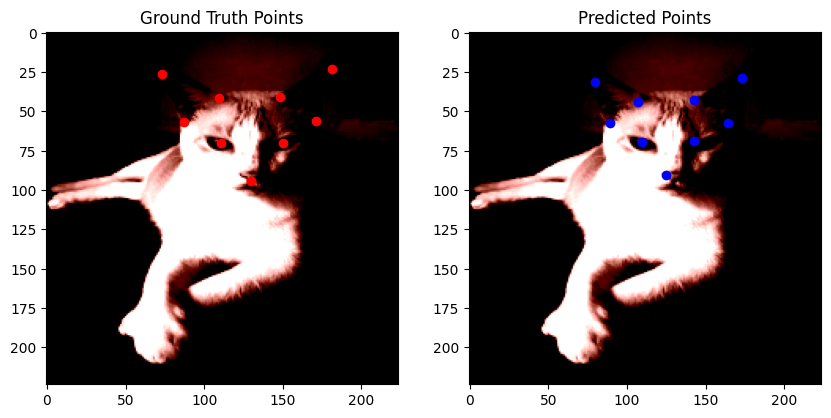

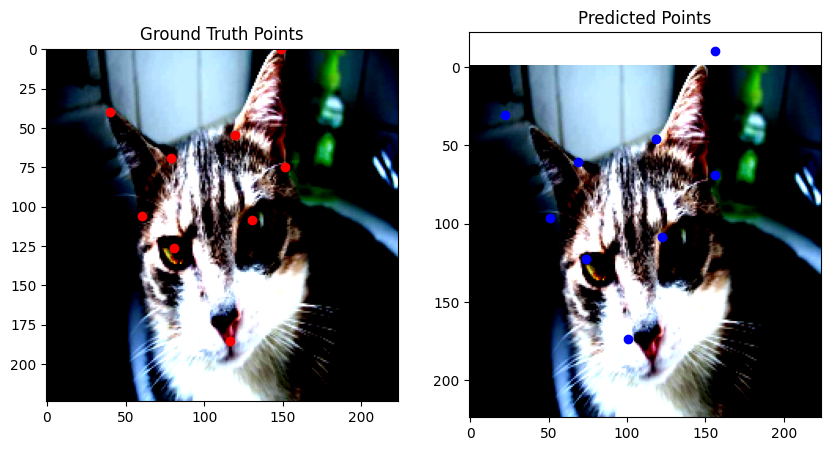

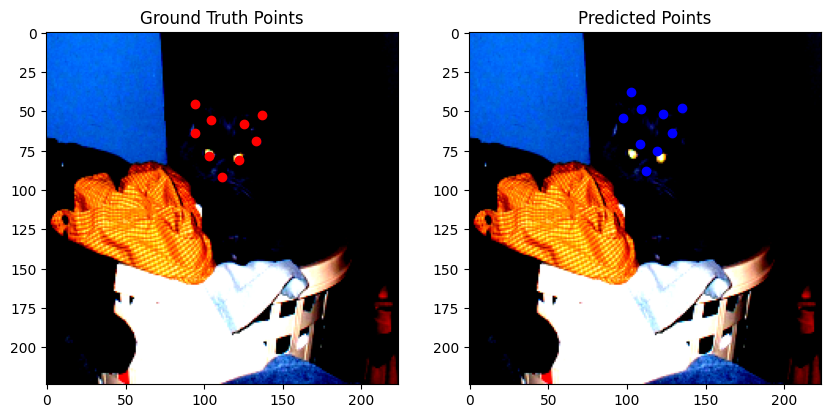

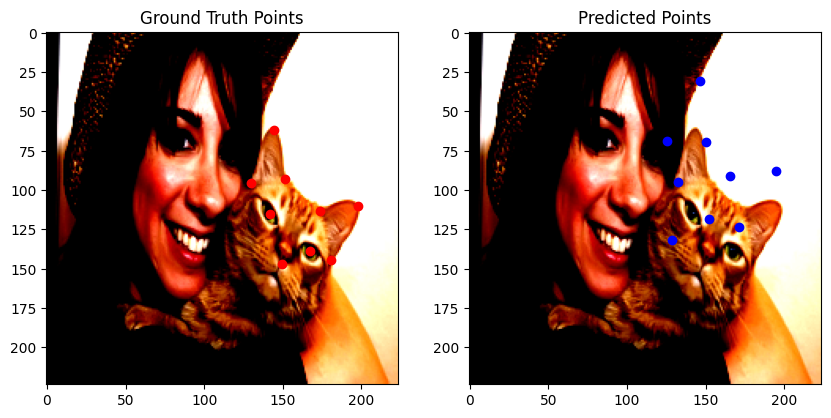

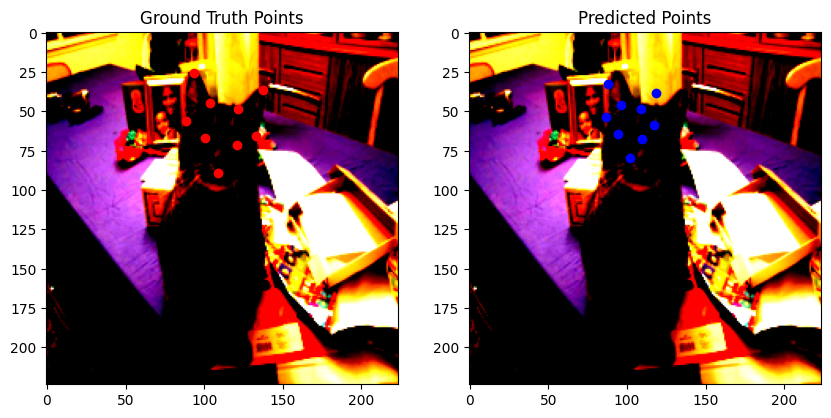

...

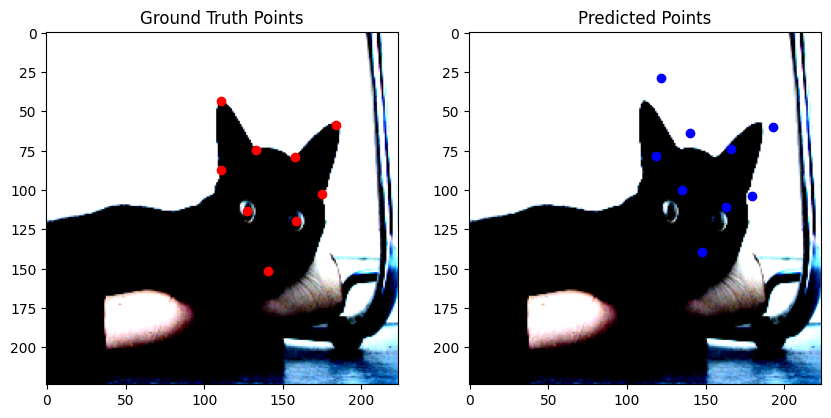

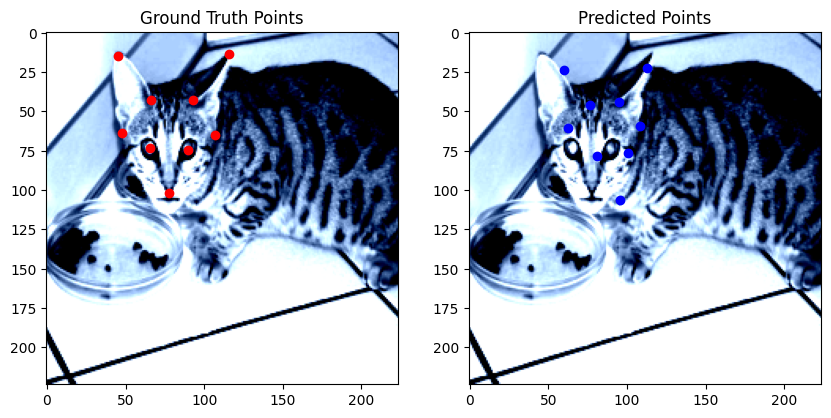

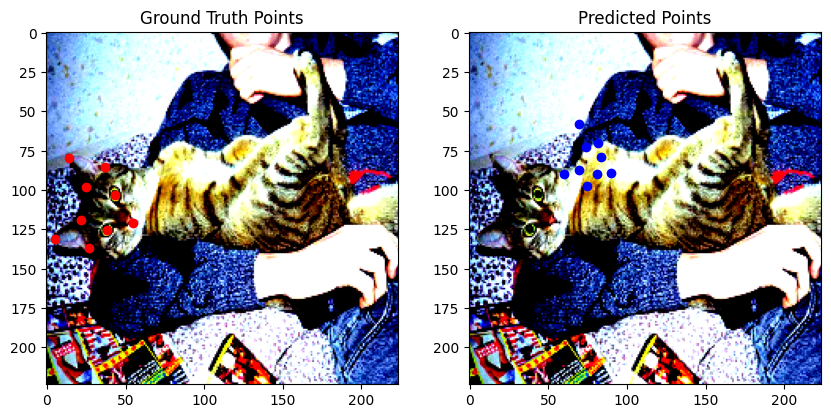

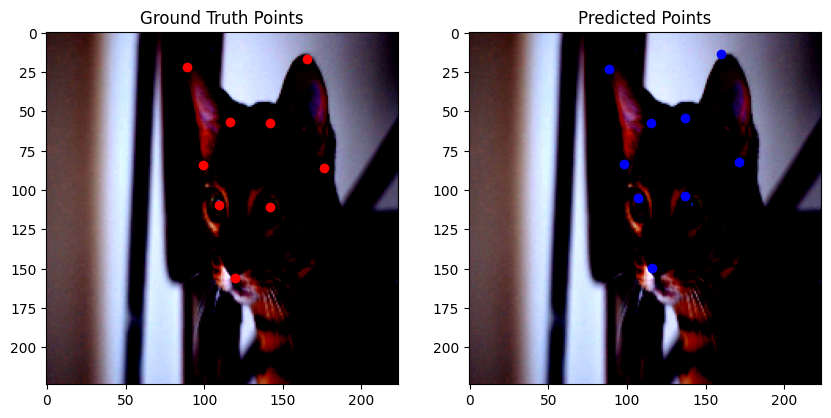

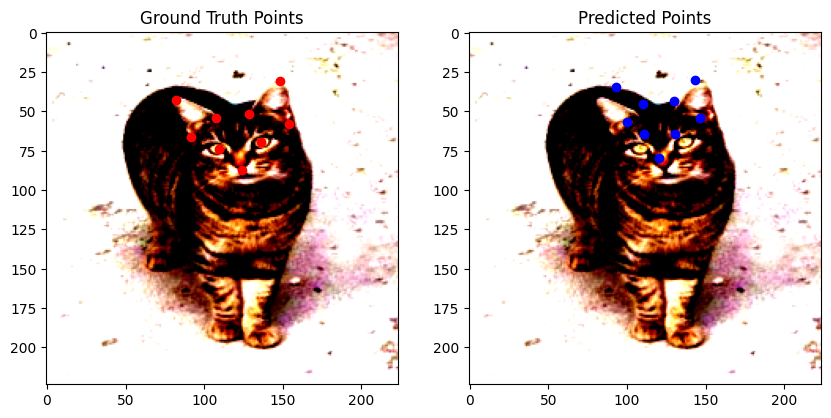

In [ ]:
# Set the model to evaluation mode
model.eval()

# Iterate through the evaluation dataloader
for batch_idx, sample in enumerate(eval_dataloader):
    images = sample['image'].to(device)
    targets = sample['points'].to(device)
    
    # Forward pass through the model to get predicted points
    with torch.no_grad():
        predicted_points = model(images)
    
    # Plot the images with points
    num_images = images.size(0)
    for i in range(num_images):
        image = images[i].cpu().permute(1, 2, 0).numpy()  # Convert image tensor to numpy array
        
        # Original points (ground truth)
        ground_truth_points = targets[i].cpu().numpy()
        
        # Predicted points
        pred_points = predicted_points[i].cpu().numpy()
        
        # Plotting setup
        plt.figure(figsize=(10, 5))
        
        # Plot original image with ground truth points
        plt.subplot(1, 2, 1)
        plt.title('Ground Truth Points')
        plt.imshow(image)
        plt.scatter(ground_truth_points[::2], ground_truth_points[1::2], c='r', marker='o')  # assuming points are flattened [x1, y1, x2, y2, ...]
        
        # Plot image with predicted points
        plt.subplot(1, 2, 2)
        plt.title('Predicted Points')
        plt.imshow(image)
        plt.scatter(pred_points[::2], pred_points[1::2], c='b', marker='o')  # assuming points are flattened [x1, y1, x2, y2, ...]
        
        plt.show()